## Content

  - **SGD**

  - **Extending Linear Regression - Polynomial Regression**

  - **Generalization and Occam's Razor**

  - **Underfit Overfit Tradeoff**
    - Geometric Intuition
    - Mathematical Intuition
    - Relating with Bias Variance

## Comparing Normal equation to GD
- There is no need to for feature scaling in Normal Equation
- GD works well for any number of dimensions. 
- But, We need to calculate $(X^TX)^{-1}$ in normal equation
  - If d is large, then closed form solution is not recommended. 


# **Stochastic Gradient Descent/ Mini Batch GD**



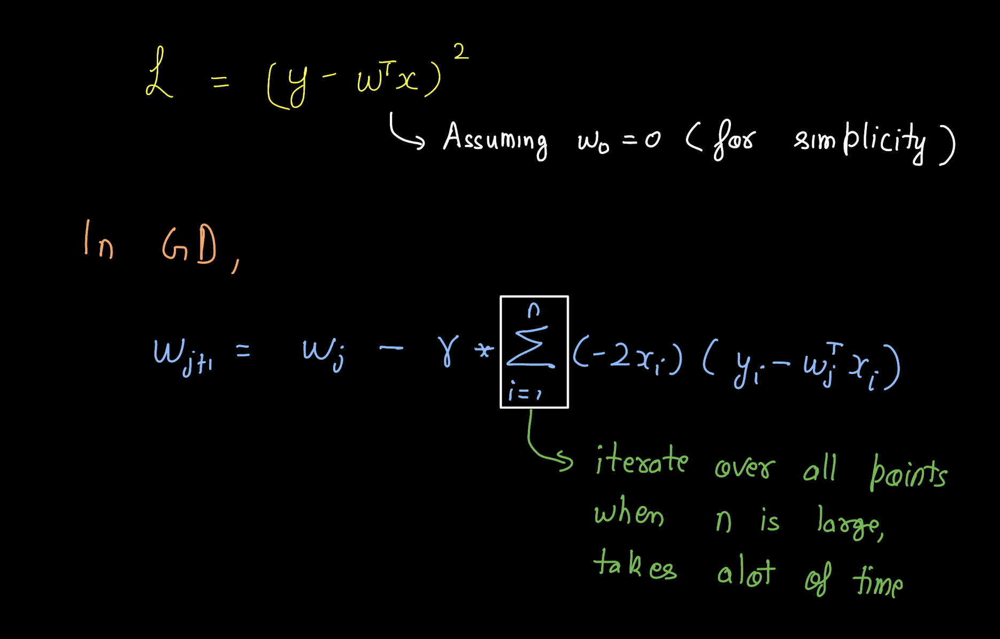

Recall that in Gradient Descent

- We take the average of the gradients of all the training examples
- use that mean gradient to update our parameters.
- one step of gradient descent in one epoch

But, there is problem with GD

#### What's the problem with GD ?

As we interate over all the points to calculate the gradient. 

- Imagine if number of datapoints is large (~ 1 million)
- For each update, we'll iterate through all the points and calculate gradient
- It becomes computationally expensive and time consuming





#### **How do we solve this problem ?**

To tackle this problem, 
- instead of using all points, we use random set of `k` points for gradient
- Each set of k points will be unique (sampling without replacement)

Here, k is called batch size.

When k = 1, it is called SGD (Stochastic Gradient Descent)

When k > 1, Mini batch GD.

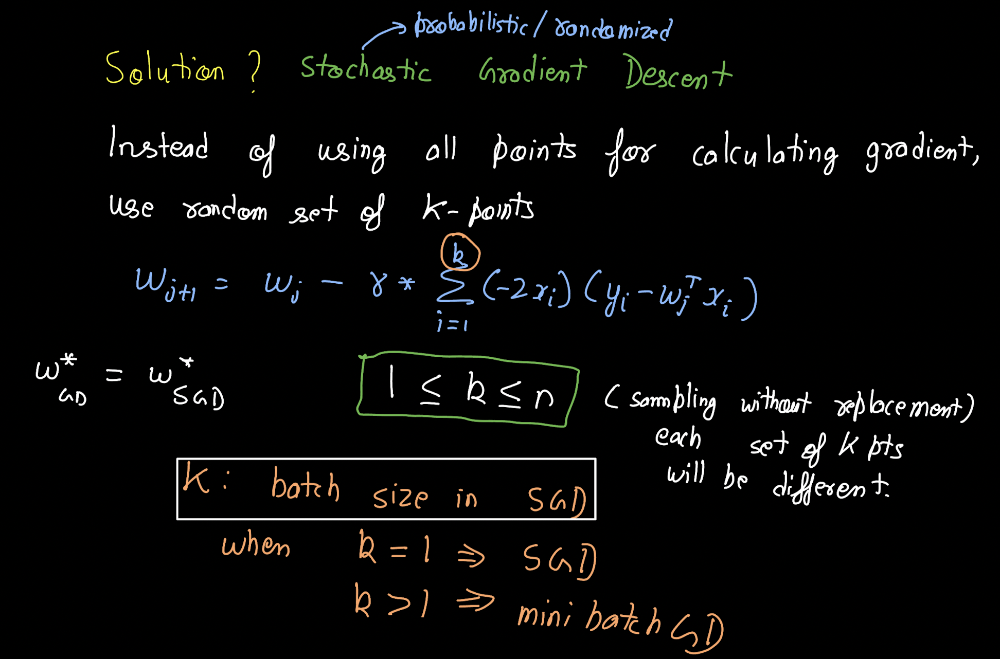

Let's look at code implementation 

#### Importing libraries


In [ ]:
# importing libraries
import numpy as np
import matplotlib.pyplot as plt

#### Creating data

multivariate_normal documentation: https://numpy.org/doc/stable/reference/random/generated/numpy.random.multivariate_normal.html

In [ ]:

mean = np.array([4.0, 5.0])
cov = np.array([[1.0, 0.95], [0.95, 1.2]])
data = np.random.multivariate_normal(mean, cov, 5000)-t


In [ ]:
data.shape

(5000, 2)

In [ ]:
data[:5]

array([[4.30760608, 5.44102037],
       [4.43681518, 6.33786896],
       [3.99303643, 4.6142862 ],
       [3.6117502 , 4.46578652],
       [5.16607604, 6.68747057]])

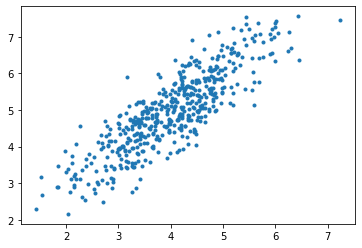

In [ ]:
# visualising data
plt.scatter(data[:500, 0], data[:500, 1], marker = '.')
plt.show()
 


In [ ]:
# adding bias column (for w0) to data
data = np.hstack((np.ones((data.shape[0], 1)), data))

In [ ]:
data[:5]

array([[1.        , 4.30760608, 5.44102037],
       [1.        , 4.43681518, 6.33786896],
       [1.        , 3.99303643, 4.6142862 ],
       [1.        , 3.6117502 , 4.46578652],
       [1.        , 5.16607604, 6.68747057]])

In [ ]:
X = data[: ,:-1]
y = data[:, -1].reshape(-1,1)


#### Model Function (also called as Hypothesis formally)


In [ ]:
# function to compute hypothesis / predictions
def predict(X, weight):
    return np.dot(X, weight)

#### Calculating Gradient 

In [ ]:
# function to compute gradient of error function w.r.t. weight
def gradient(X, y, weight):
    y_pred = predict(X, weight)
    grad = np.dot(X.transpose(), (y_pred - y))
    return grad
 


#### Calculating Error

In [ ]:
# function to compute the error for current values of weight
def cost(X, y, weight):
    y_pred = predict(X, weight)
    e = np.mean((y-y_pred)**2)

    return e

#### Creating mini batches

In [ ]:
# function to create a list containing mini-batches
def create_mini_batches(X, y, batch_size):

    mini_batches = []
    data = np.hstack((X, y))

    np.random.shuffle(data)
    minibatch_count = data.shape[0] // batch_size
    i = 0
 
    for i in range(minibatch_count + 1):
        mini_batch = data[i * batch_size: (i + 1)*batch_size, :]
        X_minibatch = mini_batch[:, :-1]
        Y_minibatch = mini_batch[:, -1].reshape((-1, 1))
        mini_batches.append((X_minibatch, Y_minibatch))

      
    # if data.shape[0] % batch_size != 0:
    #     mini_batch = data[i * batch_size:data.shape[0]]
    #     X_minibatch = mini_batch[:, :-1]
    #     Y_minibatch = mini_batch[:, -1].reshape((-1, 1))
    #     mini_batches.append((X_minibatch, Y_minibatch))
    
    
    return mini_batches

#### Implementing Mini batch GD

In [ ]:
# function to perform mini-batch gradient descent
def gradientDescent(X, y, learning_rate = 0.0001, batch_size = 32):
    weight = np.zeros((X.shape[1], 1))
    error_list = []
    max_iters = 3
    
    for itr in range(max_iters):

        mini_batches = create_mini_batches(X, y, batch_size)

        for mini_batch in mini_batches:
            X_mini, y_mini = mini_batch
            weight = weight - learning_rate * gradient(X_mini, y_mini, weight)
            error_list.append(cost(X_mini, y_mini, weight))
 
    return weight, error_list

w_0 =  [0.35057972]
w_1 =  [[1.15399635]]


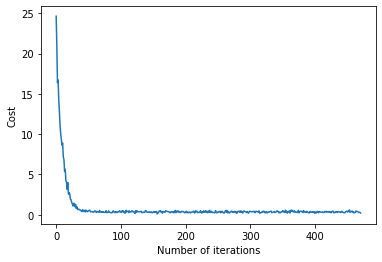

In [ ]:
weight, error_list = gradientDescent(X, y)
print("w_0 = ", weight[0])
print("w_1 = ", weight[1:])
 
# visualising gradient descent
plt.plot(error_list)
plt.xlabel("Number of iterations")
plt.ylabel("Cost")
plt.show()

# Extending Linear Regression - Polynomial Regression

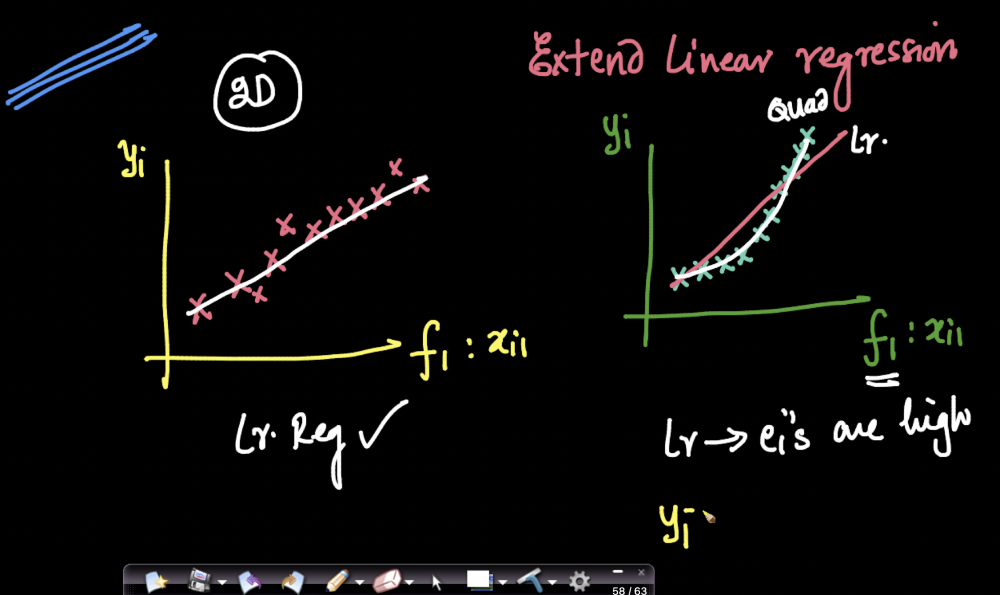

Let's coduct a small experiment  using single feature.

- Imagine we have single feature f1
- In left plot, you have good linear relationship and linear regression fits pefectly on it.
- In right plot, the points are in quadratic curve. If you fit a line to it, the error are going to be very high.

#### Question: Can we modify the linear regression to make it work in quadratic case?

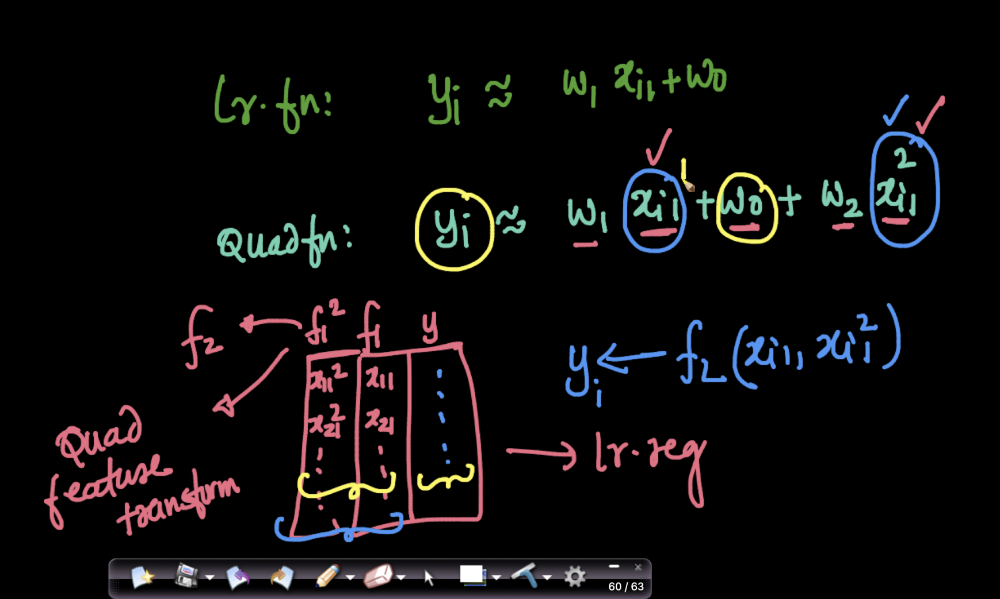

Let's try to understand it from one variable perspective

Imagine you've a linear function, then yi will be very close to $w_1 x_i{_1} + w0$

- If it is a quadratic function, yi will be close to $w_1*x_i{}_1 + wo + w2 * x_{i_1}^2$
- We are adding one more feature which is square of $x_i{}_1$. (SImple feature engineering)
- We fit a linear model on these two features. We are no more in 1 - D space as we have two feature, it is 2D space.
- In terms of $x_i{_1}$ and $x_i{}_1^2$, this is still a linear function (as $x_i{_1}$ and $x_{i_1}^2$, are features)
- We are building linear model on quadratic features.
- This is called as quadratic feature transform. 


After creating new feature, we simply pass the data to linear regression model and get the predicted value.




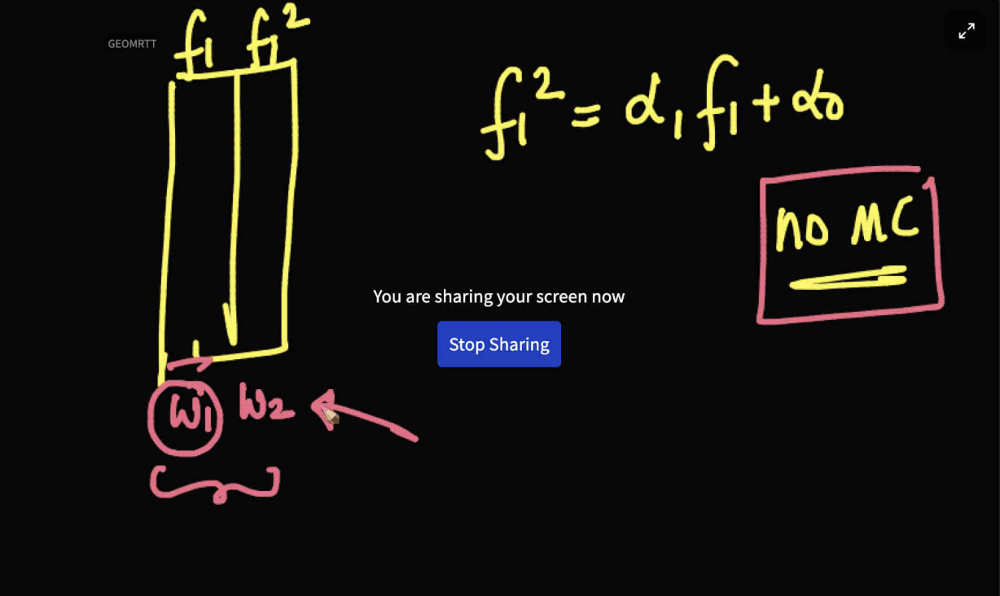

#### Will the new features be collinear ? 

The new features will be correlated but there won't be any multicollinearity as you can't represent square in terms of linear relationship

Let's look into some code now

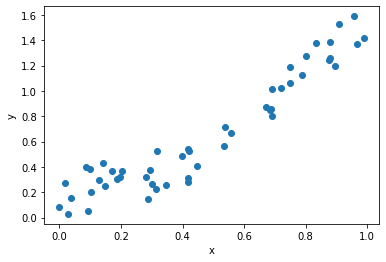

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

np.random.seed(1)
X = np.random.rand(50,1)
y = 0.7*(X**5) - \
    2.1*(X**4) + \
    2.3*(X**3) + \
    0.2*(X**2) + \
    0.3* X + \
    0.4*np.random.rand(50,1) # no data in world is perfect
fig = plt.figure()
plt.scatter(X, y)
plt.xlabel("x")
plt.ylabel("y")
plt.show()

### How does linear regression perform on this variable?

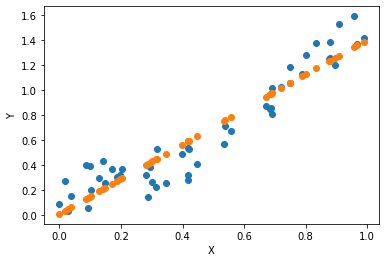

0.8919326382437994

In [ ]:
from sklearn.linear_model import LinearRegression
model = LinearRegression()
model.fit(X, y)
output = model.predict(X)
fig = plt.figure()
plt.scatter(X, y, label="samples")
plt.scatter(X, output, label="prediction")
plt.xlabel("X")
plt.ylabel("Y")
plt.show()
display(model.score(X, y))

#### Polynomial Regression

#### How does it perform when we add $X^2$ as the feature?


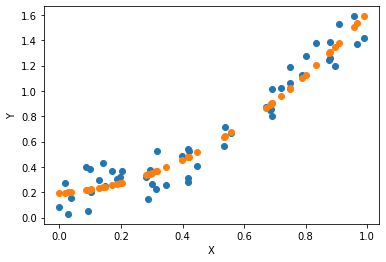

0.937213227713278

In [ ]:
from sklearn.preprocessing import StandardScaler

X_deg2 = np.hstack([X, X**2])
model_deg2 = LinearRegression()
model_deg2.fit(X_deg2, y)
output = model_deg2.predict(X_deg2)
fig = plt.figure()
plt.scatter(X, y, label="samples")
plt.scatter(X, output, label="prediction")
plt.xlabel("X")
plt.ylabel("Y")
plt.show()
display(model_deg2.score(X_deg2, y))


Note: y(x,w) is non-linear function of x but a linear function of w.

#### How does it perform when we add $X^3$ as the feature?

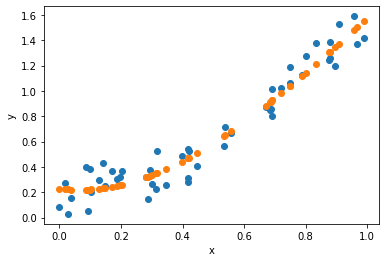

0.9384895307987051

In [ ]:
X_deg3 = np.hstack([X, X**2, X**3])
model_deg3 = LinearRegression()
model_deg3.fit(X_deg3, y)
output = model_deg3.predict(X_deg3)
fig = plt.figure()
plt.scatter(X, y, label="samples")
plt.scatter(X, output, label="prediction")
plt.xlabel("x")
plt.ylabel("y")
plt.show()
display(model_deg3.score(X_deg3, y))

Following the trend, it might be tempting to try higher degree polynomials


### Sklearn's PolynomialFeatures()

#### How can we generate "polynomial features" intead of creating polynomial `np.hstack([X, X**2, ..X**n])`?


(50, 4)

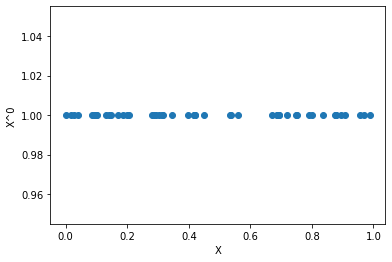

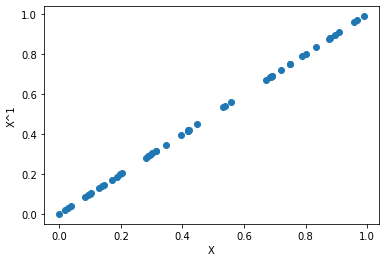

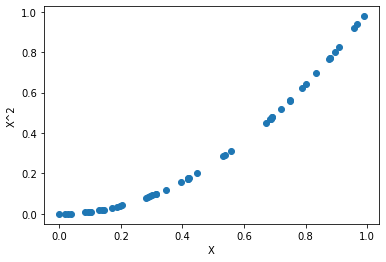

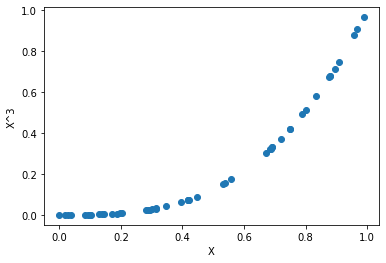

In [ ]:
from sklearn.preprocessing import PolynomialFeatures

poly = PolynomialFeatures(3)
X_poly = poly.fit_transform(X)
display(X_poly.shape) # shape of the generated features

n_features = X_poly.shape[1]

for degree in range(n_features):
    fig = plt.figure()
    plt.scatter(X, X_poly[:,degree])
    plt.xlabel("X")
    plt.ylabel(f"X^{degree}")
    plt.show()

### How to use PolynomialFeatures class to train models with different degrees?

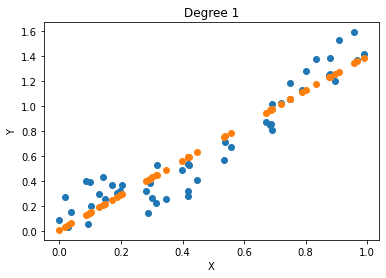

0.8919326382437994

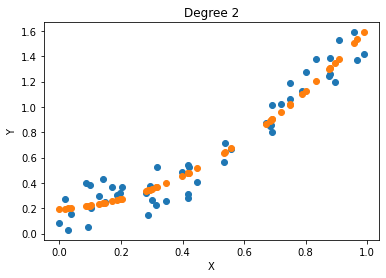

0.937213227713278

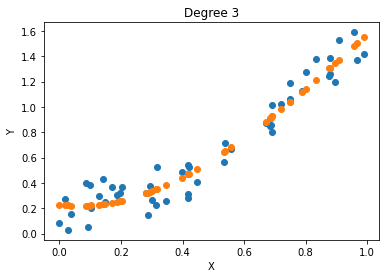

0.9384895307987051

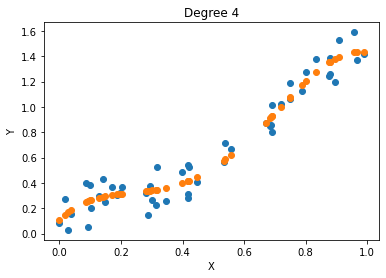

0.950995835560793

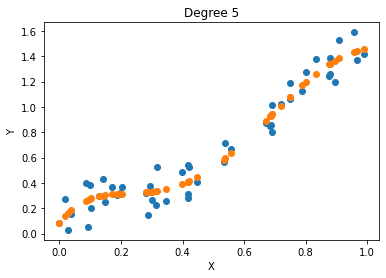

0.9515258649694076

In [ ]:
from sklearn.preprocessing import PolynomialFeatures
from sklearn.preprocessing import StandardScaler

scores = []
for i in range(1, 6):
    poly = PolynomialFeatures(i)
    X_poly = poly.fit_transform(X)
    scaler = StandardScaler()
    scaler.fit(X_poly)
    X_poly_scaled = scaler.transform(X_poly)
    model = LinearRegression()
    model.fit(X_poly_scaled, y)
    output = model.predict(X_poly_scaled)
    fig = plt.figure()
    plt.scatter(X, y, label="samples")
    plt.scatter(X, output, label="prediction")
    plt.xlabel("X")
    plt.ylabel("Y")
    plt.title(f"Degree {i}")
    plt.show()
    display(model.score(X_poly_scaled, y))
    scores.append(model.score(X_poly_scaled, y))

#### There are 50 points in the data, what is the "highest degree" which should try? 

### Which degree polynomial performs the best?

In [ ]:
from sklearn.preprocessing import PolynomialFeatures
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LinearRegression

degree = 50 # number of data-points
scores = []
for i in range(0, degree):
    poly = PolynomialFeatures(i)
    X_poly = poly.fit_transform(X)
    scaler = StandardScaler()
    scaler.fit(X_poly)
    X_poly_scaled = scaler.transform(X_poly)
    model = LinearRegression()
    model.fit(X_poly_scaled, y)
    output = model.predict(X_poly_scaled)
    scores.append(model.score(X_poly_scaled, y))


max_idx = np.argmax(scores)
print(max_idx, scores[max_idx])

31 0.9684331040517228


#### How does it perform with polynomial of degree 5?

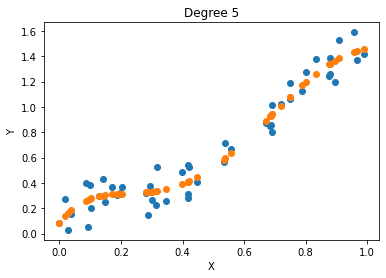

0.9515258649694076

In [ ]:
poly = PolynomialFeatures(5)
X_poly = poly.fit_transform(X)
scaler = StandardScaler()
scaler.fit(X_poly)
X_poly_scaled = scaler.transform(X_poly)
model = LinearRegression()
model.fit(X_poly_scaled, y)
output = model.predict(X_poly_scaled)
fig = plt.figure()
plt.scatter(X, y, label="ground truth")
plt.scatter(X, output, label="prediction")
plt.xlabel("X")
plt.ylabel("Y")
plt.title(f"Degree {5}")
plt.show()
display(model.score(X_poly_scaled, y))
scores.append(model.score(X_poly_scaled, y))

#### How does it perform with polynomial of degree 31?

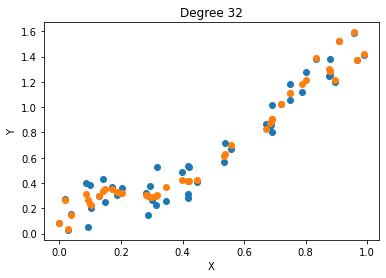

0.9683404311587434

In [ ]:
degree = 32
poly = PolynomialFeatures(degree)
X_poly = poly.fit_transform(X)
scaler = StandardScaler()
scaler.fit(X_poly)
X_poly_scaled = scaler.transform(X_poly)
model = LinearRegression()
model.fit(X_poly_scaled, y)
output = model.predict(X_poly_scaled)
fig = plt.figure()
plt.scatter(X, y, label="ground truth")
plt.scatter(X, output, label="prediction")
plt.xlabel("X")
plt.ylabel("Y")
plt.title(f"Degree {degree}")
plt.show()
display(model.score(X_poly_scaled, y))
scores.append(model.score(X_poly_scaled, y))

# Generalization and Occam's Razor

Consider a single feature $x_i{_1}$ and we want to build a linear regression on this feature data.

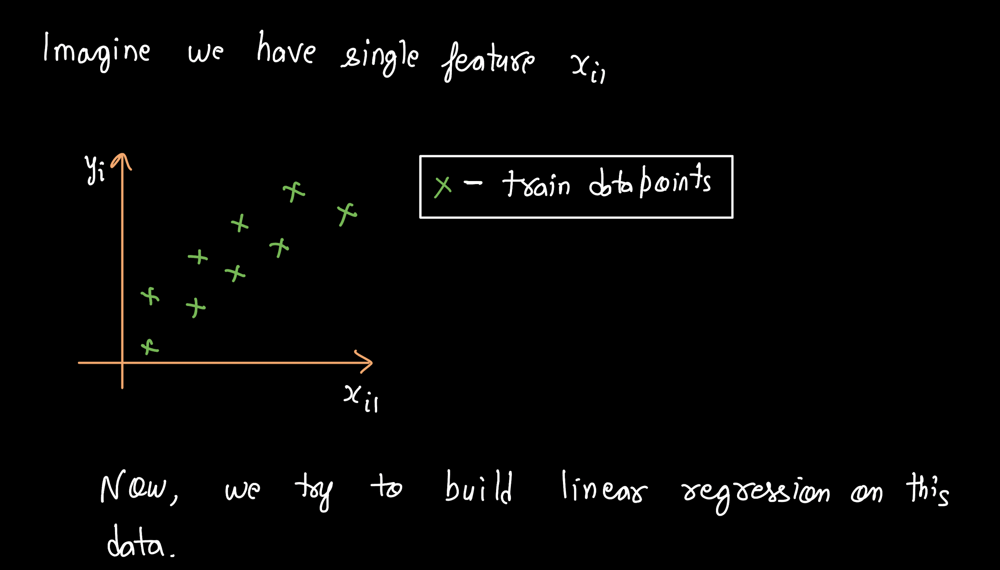

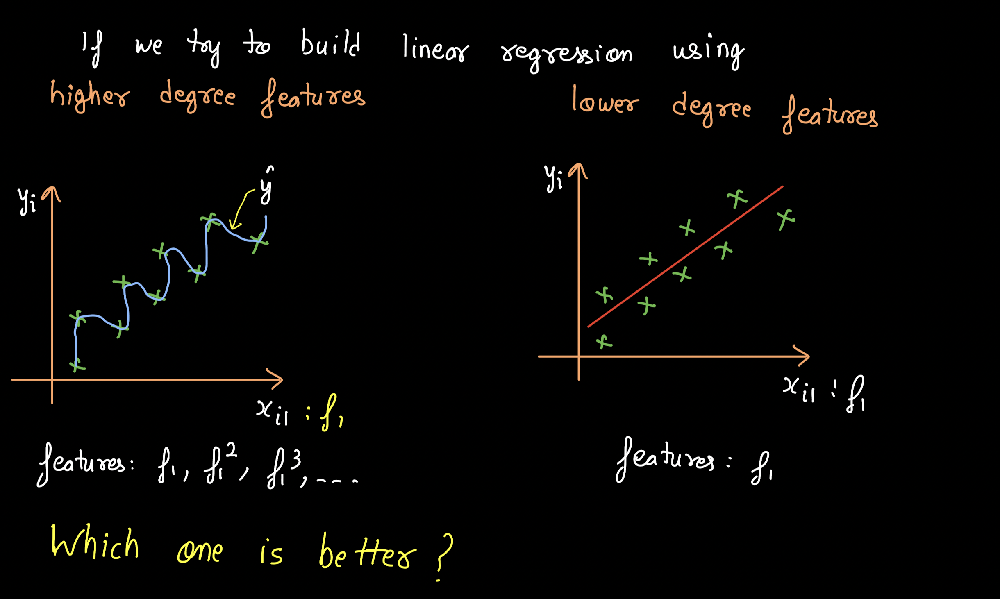

We can build the linear regression in two ways 
1. Higher degree features (<font color= 'blue'> blue curve</font>)
2. lower degree features (<font color = 'red'> red curve </font>)

Higher degree features include ($f_1, f_1^2, f_1^3, ...$)

Lower degree feature only includes $(f_1)$


If you look only from the perspective of training data, <font color = 'blue'>blue curve</font> (higher degree features) passes perfectly over all the points.

The loss in linear regression is defined as:

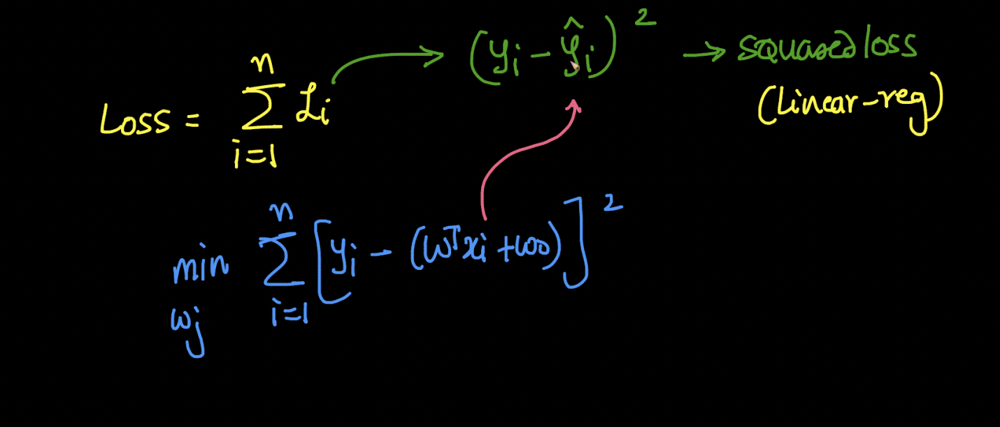

#### **What will be loss for <font color = 'blue'>blue curve</font> ?**

As it passes over all the points perfectly, the train loss will be 0

The train loss for red curve (lower order features) will be more compared to blue curve (function for higher order features)


#### Question: Which one will be better ? 

First instict tells us that the one with higher order features is better as its train loss is zero. 

Let's look into two concepts before answering the question

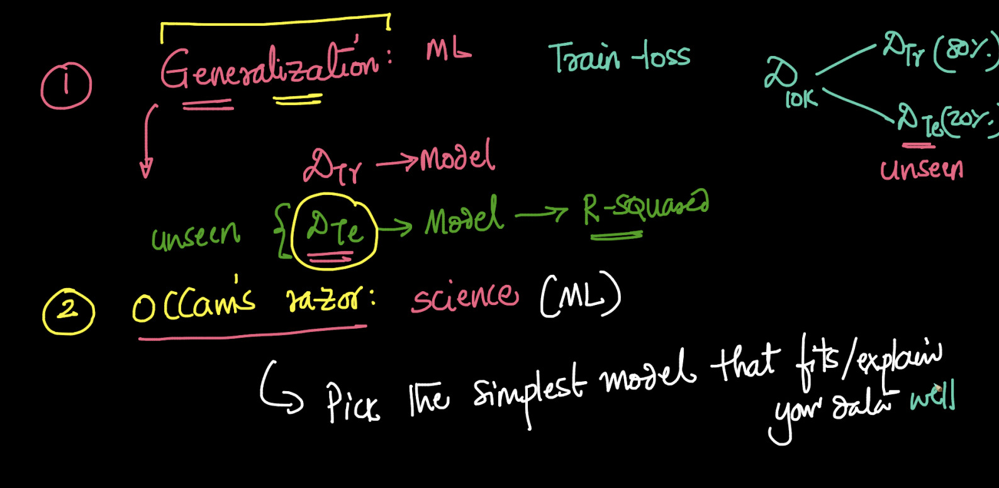

The two concepts are:
- Generalization
- Occam's razor


Before we train any machine learning model, we break it up into two parts - train and test (80- 20 typically)
- Train the model using train data.
- Pass the test data through trained model and get the R-squared.

**Generalization** means how well the model generalizes on test data data i.e. **how well the model performs on test data.**

In context of ML, **Occam's razor** says, pick the simplest model that fits/explains the data well.



Based on the above concepts, 
1. Pick the simplest model (Occam's razor)
2. Model which generalizes well on test data. (Generalization)

#### Which model will be better ? 

Red curve (model built using lower order features) as it is simplier between the two and it'll generalize better on test set.




 Consider the data for feature $f_1$

**We are given with 3 models**
  1. Linear function - $f_1$
  2. Quadratic function - $f_1, f_1^2$
  3. Cubic function - $f_1, f_1^2, f_1^3$

## **Question: Which model will you pick ?**

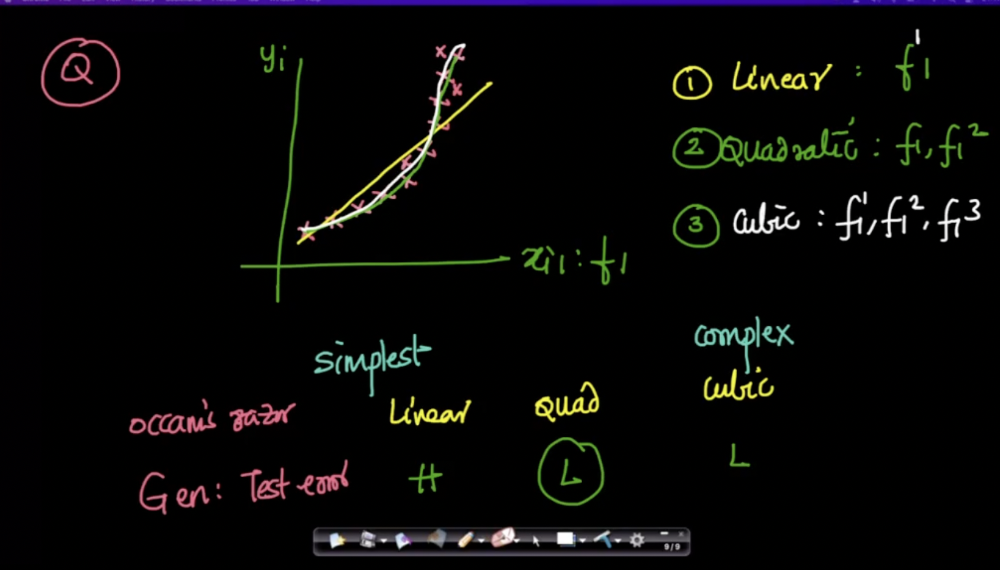

Ans: 
- If we go by Occam's razor, we might be forced to pick Linear model.
- In addition to occam's razor, we also should look at Generalization

Assume that the test error for Linear, Quad and cubic models were High, Low and Low respectively.

We'll pick up Quadratic model as we need to pick simpler model with low generalization error.

There is always trade off between Occam's razor and generalization.






## **How to create the testing set?**

#### Train Test Split 
Split the dataset into two parts training and testing. 

In [ ]:
# lets first generate a dataset of 100 points this time
np.random.seed(1)
X = np.random.rand(100,1)
y = 0.7*(X**5) - \
    2.1*(X**4) + \
    2.3*(X**3) + \
    0.2*(X**2) + \
    0.3* X + \
    0.4*np.random.rand(100,1)

from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=1)

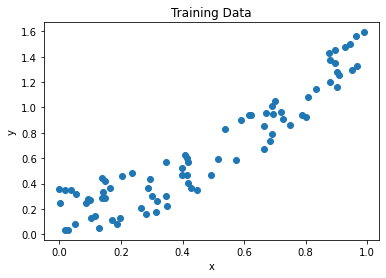

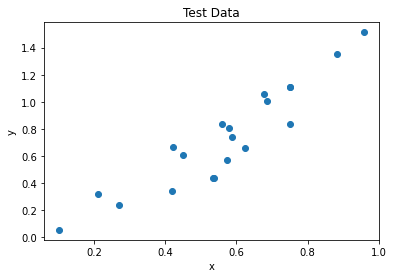

In [ ]:
fig = plt.figure()
plt.scatter(X_train, y_train)
plt.xlabel("x")
plt.ylabel("y")
plt.title("Training Data")
plt.show()

fig = plt.figure()
plt.scatter(X_test, y_test)
plt.xlabel("x")
plt.ylabel("y")
plt.title("Test Data")
plt.show()

In [ ]:
degree = 50 # number of data-points
scores = []
for i in range(0, degree):
    poly = PolynomialFeatures(i)
    X_poly = poly.fit_transform(X_train)
    scaler = StandardScaler()
    scaler.fit(X_poly)
    X_poly_scaled = scaler.transform(X_poly)
    model = LinearRegression()
    model.fit(X_poly_scaled, y_train)
    output = model.predict(X_poly_scaled)
    scores.append(model.score(X_poly_scaled, y_train))

max_idx = np.argmax(scores)
print(max_idx, scores[max_idx])

40 0.9440974271136691


#### Does the degree 5 hypothesis or degree 40 hypothesis perform better on testing set?

In [ ]:
from sklearn.pipeline import make_pipeline

In [ ]:
degree=5
polyreg_scaled = make_pipeline(PolynomialFeatures(degree), scaler, LinearRegression())
polyreg_scaled.fit(X_train,y_train)
display(polyreg_scaled.score(X_train, y_train))
display(polyreg_scaled.score(X_test, y_test))

0.9214962587812688

0.865626271039198

In [ ]:
degree=40
polyreg_scaled = make_pipeline(PolynomialFeatures(degree), scaler, LinearRegression())
polyreg_scaled.fit(X_train,y_train)
display(polyreg_scaled.score(X_train, y_train))
display(polyreg_scaled.score(X_test, y_test))

0.9440974271136691

0.7809514766504873

# **Underfit Overfit Trade off**

### Geometric Intuition

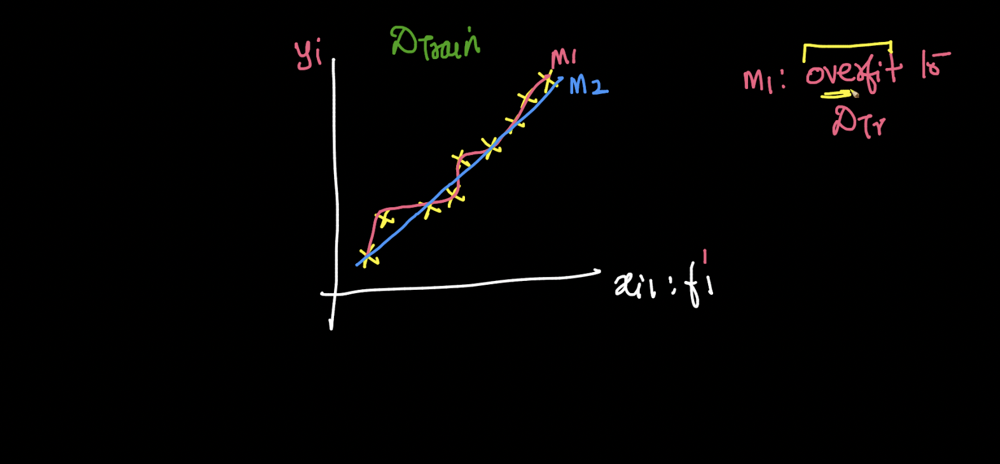

Assume we fitted two models to train data (single feature $f_1$)
- M1 (<font color = 'red'>complex</font>) - using higher degree polynomials
- M2 (<font color = 'blue'> simpler </font>) - using lower degree



We say model M1 has **overfit** to train data as 
- Data may contain noise and
- M1 is fitting to this noise as well. 


Overfitting means that our ML model is modeling (has learnt) the training data too well.


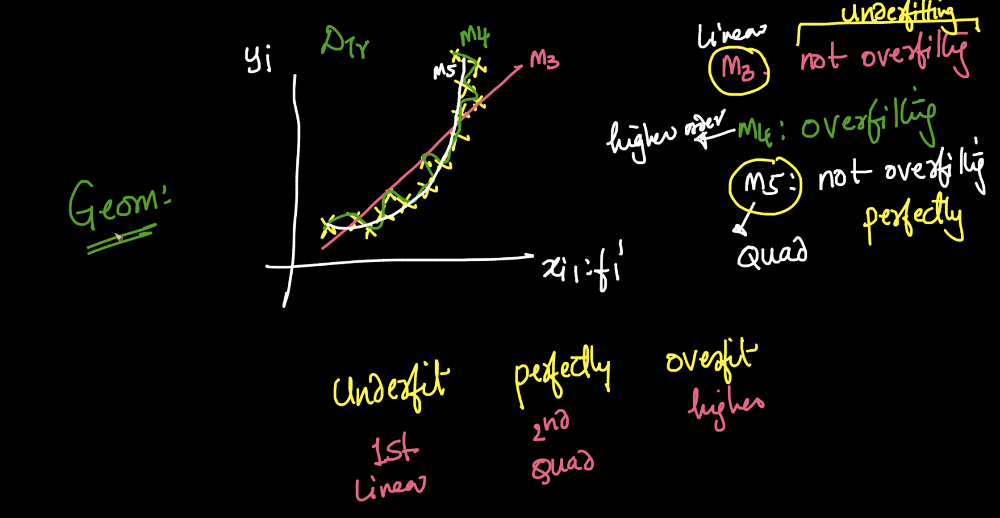

Assume another example with training data for single feature $f_1^1$

#### Is M3 (linear) overfitting to data?
No. 

#### Is M4 (higher order) overfitting to data?
Yes.

#### Is M5 (quadratic) fitting perfectly?
Yes. 


#### Now what are implications of underfitting?

**Underfitting** means that our ML **model can neither model the training data nor generalize to new unseen data**.

**An underfitted model will have poor(er) performance both on the training data and the testing data.**

Here, **M3 is underfitting.**



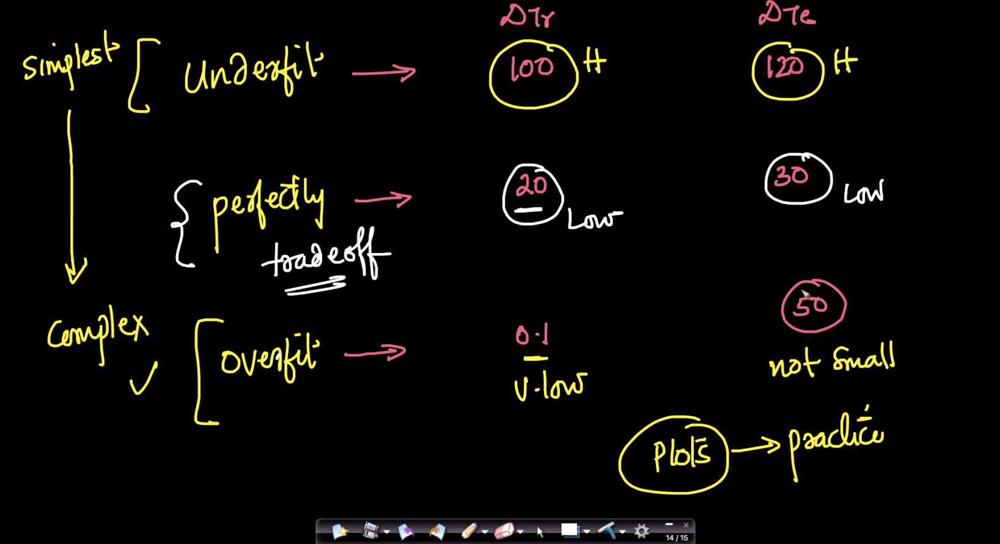

Now, We have 3 kinds of model
- Underfit
- Perfectly fit
- Overfit

#### How will each model behave in train test time ? 

- Underfit model ➡ Train error high, Test error high
- Overfit ➡ Train error very low, Test error high or not small
- Perfect fit model ➡ Both train and test error are low

# **Mathematical intuition**

#### How do we do trade off between underfitting overfitting, mathematically?

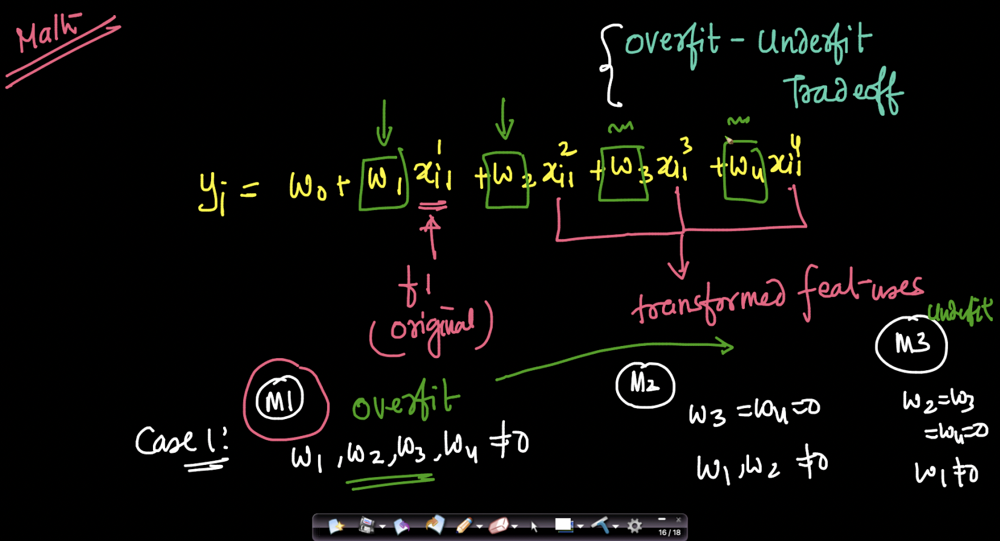

Consider the model function  

where $y_i = w_0 + w_1x_{i_1}^1 + w_2x_{i_1}^2 + w_3x_{i_1}^3 + w_4x_{i_1}^4$

- $f_1$ or $x_{i_1}$ is original feature
- Rest of features are transformed features (power of $f_1$)

We have 3 cases
- Case 1 (Model M1): $w_1, w_2, w_3, w_4 \neq 0 $
- Case 2 (Model M2): $w_1 , w_2 \neq 0$ and $w_3 = w_4 = 0$
- Case 3 (Model M3): $w_2 = w_3 = w_4 = 0$ and $w_1 \neq 0$


#### Question: Which of these is more likely to be overfit model? 
Model M1. 

Here, Critical concept is **weights**

- If weights are non zero ($w_1, w_2, w_3, w_4 \neq 0 $), it means we are giving some importance to $f_1, f_1^2, f_1^3 and  f_1^4$.

- Chances of having overfit model is more 

#### Question: Similarly, which of the the above model is underfitting ? 
Ans: Model M3


**If weights on higher order polynomial $\neq 0$, more chances of overfit**



# Relating with Bias Variance


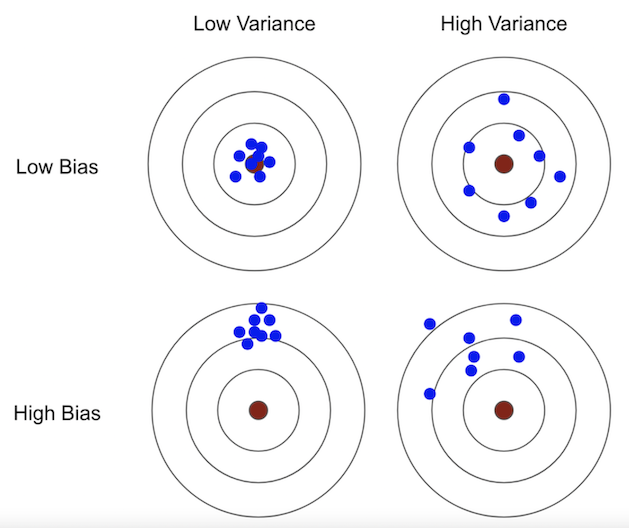

Let's try to understand with target shooting example:

**High bias is equivalent to aiming in the wrong place.** 

**High variance is equivalent to having an unsteady aim.**

This can lead to the following scenarios:

- Low bias, low variance: Aiming at the target and hitting it with good precision.
- Low bias, high variance: Aiming at the target, but not hitting it consistently.
- High bias, low variance: Aiming off the target, but being consistent.
- High bias, high variance: Aiming off the target and being inconsistent.

Ideally, a model trained using different sets of training set would give more or less similar results. If we change the dataset a bit, the model prediction should not be very different.

Now, given a model, 
- if you train it with different sets of training data (of same distribution)
- but the result are always systematically off from the truth value
- It is said to be **high bias model**
- Since the prediction are always consistent but off, both train and test data will be high.

Similarly, for a given model
- If you train it with different sets of training data
- and the predictions vary too much for each i.e. variance in prediction
- It is said to be **high variance** model
- High variance can be identified
    - Low training error (model is doing good on training data)
    - High test error (model sucks on unseen data)







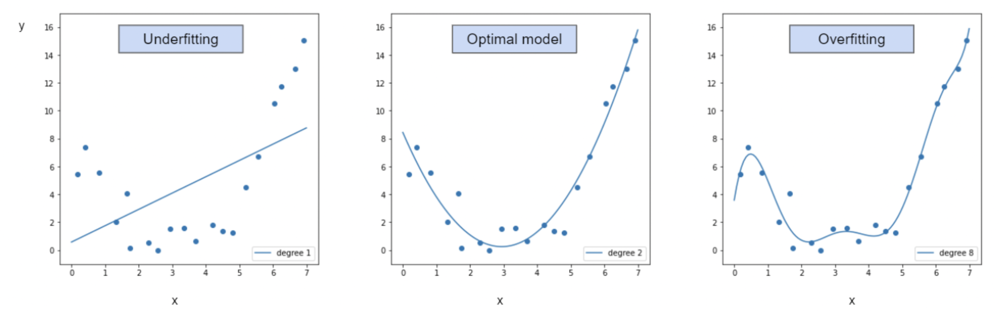

In machine learning terminology, 
- underfitting means that a model is too general, implying  high bias - low variance  (for example: fitting a line on quadratic data)

- while overfitting means that a model is too specific, implying  low bias - high variance. (for example: fitting higher order polynomial on quadratic data)

When training a model, it is important to balance these two. Since you can’t realistically avoid bias and variance altogether, this is called the bias-variance tradeoff.

# **Where is the sweet-spot?**

The sweet spot is defined as the point where the model’s performance on both the training set and the test (unseen) test set remain high.

#### How to choose the degree methodically? (How do we find the "sweet-spot")

Check which degree polynomial hypothesis performs best on test set and acceptably well on training set. 

In [ ]:
from sklearn.preprocessing import PolynomialFeatures
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LinearRegression

degrees = 32 # number of data-points
train_scores = []
test_scores = []
for degree in range(1, degrees):
    polyreg_scaled = make_pipeline(PolynomialFeatures(degree), scaler, LinearRegression())
    polyreg_scaled.fit(X_train, y_train)
    train_score = polyreg_scaled.score(X_train, y_train)
    test_score = polyreg_scaled.score(X_test, y_test)
    train_scores.append(train_score)
    test_scores.append(test_score)

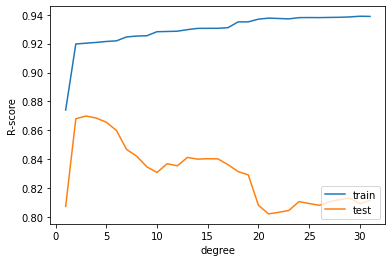

In [ ]:
plt.figure()
plt.plot(list(range(1, 32)), train_scores, label="train")
plt.plot(list(range(1, 32)), test_scores, label="test")
plt.legend(loc='lower right')
plt.xlabel("degree")
plt.ylabel("R-score")
plt.show()